# 2.3 Random Forests
## This script contains the following points:
### 01. Importing Libraries and Data:
### 02. Preparing Data
### 03. Random Forest

### 01. Importing Libraries and Data

In [42]:
# Importing libraries
import pandas as pd
import numpy as np
import os
import seaborn as sns
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics
from sklearn.tree import plot_tree
from sklearn import tree

In [3]:
# Creating path variable
path = r'/home/cwidner/Documents/CareerFoundry/MachineLearning'

In [5]:
# Loading in weather and pleasant datasets
df_weather = pd.read_csv(os.path.join(path,'02 Data','Prepared Data','weather_cleaned.csv'),index_col=False)
df_weather.shape

(22950, 136)

In [7]:
df_weather.drop(columns=['Unnamed: 0'],inplace=True)
df_weather.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [9]:
df_pleasant = pd.read_csv(os.path.join(path,'02 Data','Prepared Data','pleasant_weather_cleaned.csv'),index_col=False)
df_pleasant.shape

(22950, 16)

In [11]:
df_pleasant.drop(columns=['Unnamed: 0'],inplace=True)
df_pleasant.head()

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [13]:
# Loading weather data with dates
df_w = pd.read_csv(os.path.join(path,'02 Data','Original Data','Dataset-weather-prediction-dataset-processed.csv'),index_col=False)
df_w.shape

(22950, 170)

In [15]:
df_w.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.018,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.018,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.018,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.018,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.018,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4


### 02. Preparing Data

In [17]:
# Concatenating DATE column of the original weather data to the cleaned weather data
df_weather = pd.concat([df_w['DATE'],df_weather],axis=1)
df_weather

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,19600102,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,19600103,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,19600104,3,0.92,1.0180,0.58,0.00,4.1,6.3,3.8,10.6,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,19600105,6,0.95,1.0180,0.65,0.14,5.4,3.0,-0.7,6.0,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,1,0.79,1.0248,1.34,0.22,7.7,15.9,11.4,21.4,...,14.2,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22946,20221028,6,0.77,1.0244,1.34,0.22,5.4,16.7,14.3,21.9,...,14.3,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22947,20221029,4,0.76,1.0227,1.34,0.22,6.1,16.7,13.1,22.4,...,14.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22948,20221030,5,0.80,1.0212,1.34,0.22,5.8,15.4,11.6,21.1,...,12.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5


In [19]:
# Reducing data to just the 1990s
df_decade = df_weather[df_weather['DATE'].astype(str).str[:3]=='199']
df_decade

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
10958,19900101,0,0.83,1.0217,0.60,0.00,7.2,-2.1,-3.6,1.2,...,-0.3,3,0.82,1.0068,0.20,0.51,2.0,6.9,4.5,9.4
10959,19900102,2,0.84,1.0238,0.48,0.00,2.3,-1.8,-3.9,1.7,...,-3.4,5,0.79,1.0040,0.21,1.48,0.1,7.3,4.7,9.9
10960,19900103,8,0.89,1.0231,0.20,0.00,0.0,-2.2,-4.2,0.4,...,-2.6,4,0.90,1.0094,0.38,0.00,4.9,7.8,4.8,10.7
10961,19900104,2,0.77,1.0265,0.54,0.00,5.6,-0.7,-3.1,2.2,...,0.5,6,0.93,1.0112,0.13,0.92,0.0,6.5,2.0,11.0
10962,19900105,7,0.81,1.0286,0.23,0.04,0.2,0.0,-3.1,2.6,...,0.8,4,0.91,1.0108,0.20,0.56,1.2,9.4,7.2,11.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,19991227,7,0.74,0.9953,0.28,1.93,1.0,5.0,1.5,6.5,...,1.6,7,0.75,0.9954,0.15,0.41,0.1,4.8,3.0,7.5
14606,19991228,8,0.88,0.9956,0.13,1.22,0.0,2.4,1.0,3.4,...,1.0,3,0.73,1.0102,0.41,0.03,5.1,5.3,2.5,8.1
14607,19991229,8,0.84,1.0162,0.21,0.11,0.1,1.8,1.0,2.7,...,-1.1,5,0.81,1.0229,0.35,0.85,3.9,7.1,4.2,9.1
14608,19991230,7,0.80,1.0276,0.26,0.01,0.5,1.1,-0.3,3.4,...,-2.5,8,0.94,1.0171,0.14,0.27,0.0,8.4,5.5,11.2


In [23]:
# Dropping DATE column
df_decade = df_decade.drop(columns=['DATE'],axis=1)
df_decade

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
10958,0,0.83,1.0217,0.60,0.00,7.2,-2.1,-3.6,1.2,2,...,-0.3,3,0.82,1.0068,0.20,0.51,2.0,6.9,4.5,9.4
10959,2,0.84,1.0238,0.48,0.00,2.3,-1.8,-3.9,1.7,8,...,-3.4,5,0.79,1.0040,0.21,1.48,0.1,7.3,4.7,9.9
10960,8,0.89,1.0231,0.20,0.00,0.0,-2.2,-4.2,0.4,5,...,-2.6,4,0.90,1.0094,0.38,0.00,4.9,7.8,4.8,10.7
10961,2,0.77,1.0265,0.54,0.00,5.6,-0.7,-3.1,2.2,5,...,0.5,6,0.93,1.0112,0.13,0.92,0.0,6.5,2.0,11.0
10962,7,0.81,1.0286,0.23,0.04,0.2,0.0,-3.1,2.6,0,...,0.8,4,0.91,1.0108,0.20,0.56,1.2,9.4,7.2,11.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,7,0.74,0.9953,0.28,1.93,1.0,5.0,1.5,6.5,5,...,1.6,7,0.75,0.9954,0.15,0.41,0.1,4.8,3.0,7.5
14606,8,0.88,0.9956,0.13,1.22,0.0,2.4,1.0,3.4,8,...,1.0,3,0.73,1.0102,0.41,0.03,5.1,5.3,2.5,8.1
14607,8,0.84,1.0162,0.21,0.11,0.1,1.8,1.0,2.7,6,...,-1.1,5,0.81,1.0229,0.35,0.85,3.9,7.1,4.2,9.1
14608,7,0.80,1.0276,0.26,0.01,0.5,1.1,-0.3,3.4,3,...,-2.5,8,0.94,1.0171,0.14,0.27,0.0,8.4,5.5,11.2


In [25]:
# Concatenating DATE column of original weather data to cleaned pleasant dataset
df_pleasant = pd.concat([df_w['DATE'],df_pleasant],axis=1)
df_pleasant

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [27]:
# Reducing pleasant dataset to just 1990s
df_pleasant_decade = df_pleasant[df_pleasant['DATE'].astype(str).str[:3]=='199']
df_pleasant_decade

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
10958,19900101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10959,19900102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10960,19900103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10961,19900104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10962,19900105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,19991227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14606,19991228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14607,19991229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14608,19991230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [29]:
# Dropping DATE column
df_pleasant_decade = df_pleasant_decade.drop(columns=['DATE'],axis=1)
df_pleasant_decade

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
10958,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10959,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10960,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10961,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10962,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14606,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14607,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14608,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### 03. Random Forest

In [32]:
# Creating random seed
tf.random.set_seed(42)

In [34]:
# Creating matrix
X = df_decade
y = df_pleasant_decade

print(X.shape)
print(y.shape)

(3652, 135)
(3652, 15)


In [44]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [46]:
print(X_train.shape,y_train.shape)
print(X_test.shape,y_test.shape)

(2921, 135) (2921, 15)
(731, 135) (731, 15)


In [48]:
# Creating RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_train,y_train)

RandomForestClassifier()

In [52]:
# Performing predictions on test dataset
y_pred = clf.predict(X_test)

# Calculating accuracy
print('Model Accuracy: ', metrics.accuracy_score(y_test,y_pred)) 

Model Accuracy:  0.6032831737346102


[Text(0.40779734903033793, 0.9736842105263158, 'x[42] <= 13.45\ngini = 0.314\nsamples = 1796\nvalue = [[2234.0, 687.0]\n[1943.0, 978.0]\n[1989.0, 932.0]\n[2344.0, 577.0]\n[2327.0, 594.0]\n[2292.0, 629.0]\n[2352.0, 569.0]\n[2136.0, 785.0]\n[2341.0, 580.0]\n[1624.0, 1297.0]\n[2363.0, 558.0]\n[2431.0, 490.0]\n[2921.0, 0.0]\n[2463.0, 458.0]\n[2736.0, 185.0]]'),
 Text(0.1273331493215566, 0.9210526315789473, 'x[89] <= 17.95\ngini = 0.105\nsamples = 1143\nvalue = [[1772, 122]\n[1611, 283]\n[1690, 204]\n[1861, 33]\n[1850, 44]\n[1778, 116]\n[1866, 28]\n[1727, 167]\n[1861, 33]\n[1363, 531]\n[1833, 61]\n[1858, 36]\n[1894, 0]\n[1861, 33]\n[1850, 44]]'),
 Text(0.046991007424475165, 0.868421052631579, 'x[70] <= 5.65\ngini = 0.029\nsamples = 764\nvalue = [[1253.0, 21.0]\n[1162.0, 112.0]\n[1212.0, 62.0]\n[1269.0, 5.0]\n[1269.0, 5.0]\n[1262.0, 12.0]\n[1273.0, 1.0]\n[1245.0, 29.0]\n[1267.0, 7.0]\n[1274.0, 0.0]\n[1251.0, 23.0]\n[1270.0, 4.0]\n[1274.0, 0.0]\n[1270.0, 4.0]\n[1269.0, 5.0]]'),
 Text(0.025889

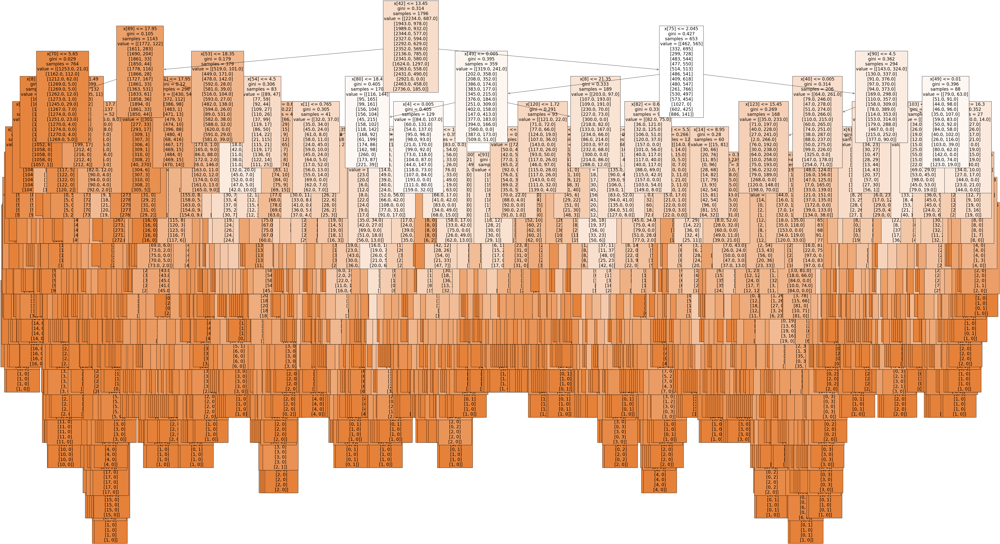

In [54]:
pred = ['Good Weather','Bad Weather']

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15],fontsize=20,class_names=pred,filled=True)

In [56]:
fig.savefig(os.path.join(path,'04 Analysis','Visualizations','tree.png'))

[Text(0.43126228409223755, 0.9761904761904762, 'x[80] <= 18.25\ngini = 0.322\nsamples = 1837\nvalue = [[2226.0, 695.0]\n[1919.0, 1002.0]\n[1937.0, 984.0]\n[2342.0, 579.0]\n[2302.0, 619.0]\n[2235.0, 686.0]\n[2359.0, 562.0]\n[2090.0, 831.0]\n[2318.0, 603.0]\n[1618.0, 1303.0]\n[2339.0, 582.0]\n[2407.0, 514.0]\n[2921.0, 0.0]\n[2450.0, 471.0]\n[2706.0, 215.0]]'),
 Text(0.13495673624912322, 0.9285714285714286, 'x[87] <= 13.15\ngini = 0.126\nsamples = 1253\nvalue = [[1826, 168]\n[1628, 366]\n[1711, 283]\n[1961, 33]\n[1936, 58]\n[1831, 163]\n[1953, 41]\n[1754, 240]\n[1986, 8]\n[1388, 606]\n[1914, 80]\n[1924, 70]\n[1994, 0]\n[1926, 68]\n[1929, 65]]'),
 Text(0.06622632686462473, 0.8809523809523809, 'x[21] <= 2.67\ngini = 0.036\nsamples = 785\nvalue = [[1233.0, 27.0]\n[1144.0, 116.0]\n[1194.0, 66.0]\n[1254.0, 6.0]\n[1252.0, 8.0]\n[1245.0, 15.0]\n[1253.0, 7.0]\n[1227.0, 33.0]\n[1259.0, 1.0]\n[1220.0, 40.0]\n[1240.0, 20.0]\n[1250.0, 10.0]\n[1260.0, 0.0]\n[1250.0, 10.0]\n[1259.0, 1.0]]'),
 Text(0.04

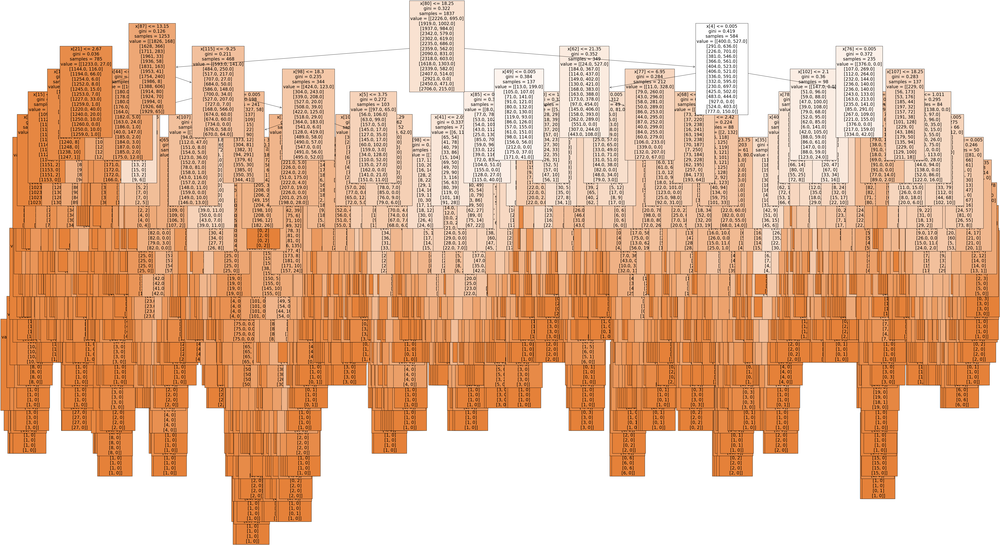

In [58]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[75],fontsize=20,class_names=pred,filled=True)

In [60]:
fig.savefig(os.path.join(path,'04 Analysis','Visualizations','tree2.png'))

In [62]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
newarray

array([0.0021101 , 0.00335821, 0.00298163, 0.00429071, 0.01495913,
       0.00563269, 0.01912872, 0.00540252, 0.02671968, 0.00376061,
       0.00387289, 0.00328129, 0.00346341, 0.01455926, 0.00490111,
       0.00801262, 0.00308302, 0.01055865, 0.00283715, 0.00328459,
       0.00275589, 0.00417535, 0.00999022, 0.00460231, 0.01174598,
       0.0083063 , 0.02099341, 0.00466433, 0.00255955, 0.00556697,
       0.00415107, 0.01428011, 0.00473259, 0.01944664, 0.0023196 ,
       0.03105765, 0.00241711, 0.00358118, 0.00391693, 0.00405252,
       0.01514954, 0.00895528, 0.02611831, 0.00278787, 0.02699866,
       0.00175271, 0.0035155 , 0.00434311, 0.00355937, 0.00864902,
       0.00353076, 0.01465162, 0.00254043, 0.01737315, 0.00315215,
       0.00359118, 0.00317992, 0.00317932, 0.0103046 , 0.00522314,
       0.02515786, 0.00526468, 0.01654534, 0.00309047, 0.00370099,
       0.00318199, 0.00398524, 0.01496296, 0.00466436, 0.01700112,
       0.00273927, 0.01743432, 0.00522855, 0.00475181, 0.00353

In [64]:
np.set_printoptions(threshold=1000)

In [66]:
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[0.0021101 , 0.00335821, 0.00298163, 0.00429071, 0.01495913,
         0.00563269, 0.01912872, 0.00540252, 0.02671968],
        [0.00376061, 0.00387289, 0.00328129, 0.00346341, 0.01455926,
         0.00490111, 0.00801262, 0.00308302, 0.01055865],
        [0.00283715, 0.00328459, 0.00275589, 0.00417535, 0.00999022,
         0.00460231, 0.01174598, 0.0083063 , 0.02099341],
        [0.00466433, 0.00255955, 0.00556697, 0.00415107, 0.01428011,
         0.00473259, 0.01944664, 0.0023196 , 0.03105765],
        [0.00241711, 0.00358118, 0.00391693, 0.00405252, 0.01514954,
         0.00895528, 0.02611831, 0.00278787, 0.02699866],
        [0.00175271, 0.0035155 , 0.00434311, 0.00355937, 0.00864902,
         0.00353076, 0.01465162, 0.00254043, 0.01737315],
        [0.00315215, 0.00359118, 0.00317992, 0.00317932, 0.0103046 ,
         0.00522314, 0.02515786, 0.00526468, 0.01654534],
        [0.00309047, 0.00370099, 0.00318199, 0.00398524, 0.01496296,
         0.00466436, 0.01700112, 0.0027392

In [92]:
sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.08458338, 0.05549286, 0.06869119, 0.0887785 , 0.09397742,
       0.05991567, 0.0755982 , 0.07076072, 0.12489707, 0.0609418 ,
       0.05251494, 0.05053485, 0.02904834, 0.05635796, 0.0279071 ])

In [94]:
stations = [
    'BASEL',
    'BELBRADE',
    'BUDAPEST',
    'DEBILT',
    'DUSSELDORF',
    'HEATHROW',
    'KASSEL',
    'LJUBLJANA',
    'MAASTRICHT',
    'MADRID',
    'MUNCHENB',
    'OSLO',
    'SONNBLICK',
    'STOCKHOLM',
    'VALENTIA'
]

In [96]:
important = pd.Series(sumarray,index=stations)
important

BASEL         0.084583
BELBRADE      0.055493
BUDAPEST      0.068691
DEBILT        0.088778
DUSSELDORF    0.093977
HEATHROW      0.059916
KASSEL        0.075598
LJUBLJANA     0.070761
MAASTRICHT    0.124897
MADRID        0.060942
MUNCHENB      0.052515
OSLO          0.050535
SONNBLICK     0.029048
STOCKHOLM     0.056358
VALENTIA      0.027907
dtype: float64

['BASEL', 'BELBRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 'MUNCHENB', 'OSLO', 'SONNBLICK', 'STOCKHOLM', 'VALENTIA']


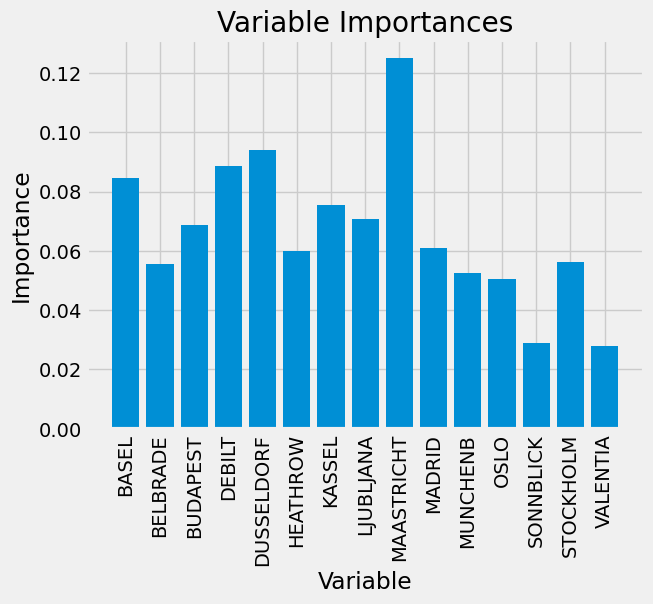

In [100]:
%matplotlib inline

plt.style.use('fivethirtyeight')
x_values = list(range(len(important)))
print(stations)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, stations, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### Maastricht

In [106]:
# Creatring MAASTRICHT subset
df_maastricht = df_weather[['MAASTRICHT_cloud_cover','MAASTRICHT_humidity','MAASTRICHT_pressure','MAASTRICHT_global_radiation','MAASTRICHT_precipitation','MAASTRICHT_sunshine','MAASTRICHT_temp_mean','MAASTRICHT_temp_min','MAASTRICHT_temp_max']]
df_maastricht

,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1
1,8,0.92,1.0062,0.17,1.34,0.4,8.6,7.5,9.9
2,7,0.97,1.0167,0.12,0.46,0.0,6.9,5.5,9.9
3,7,0.89,1.0277,0.16,0.00,0.3,7.0,3.0,10.0
4,7,0.92,1.0259,0.12,0.56,0.0,8.1,2.5,11.1
...,...,...,...,...,...,...,...,...,...
22945,8,0.67,1.0201,1.17,0.20,5.3,18.6,14.1,22.6
22946,7,0.70,1.0190,1.17,0.20,5.0,18.9,15.8,23.5
22947,8,0.69,1.0183,1.17,0.20,3.2,18.2,13.7,24.3
22948,8,0.73,1.0181,1.17,0.20,6.8,16.3,12.8,21.4


In [112]:
df_maastricht_pleasant = df_pleasant[['MAASTRICHT_pleasant_weather']]
df_maastricht_pleasant

,MAASTRICHT_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [174]:
# Creating matrix
X = df_maastricht
y = df_maastricht_pleasant

print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [176]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [178]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [180]:
# Creating RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_train,y_train)

/home/cwidner/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [182]:
# Performing predictions on test dataset
y_pred = clf.predict(X_test)

# Calculating accuracy
print('Model Accuracy: ', metrics.accuracy_score(y_test,y_pred)) 

Model Accuracy:  1.0


[Text(0.7101089015151515, 0.9642857142857143, 'x[5] <= 7.95\ngini = 0.326\nsamples = 11653\nvalue = [14600, 3760]\nclass = Good Weather'),
 Text(0.5187026515151515, 0.8928571428571429, 'x[8] <= 17.95\ngini = 0.173\nsamples = 9196\nvalue = [13162, 1392]\nclass = Good Weather'),
 Text(0.5035511363636364, 0.8214285714285714, 'gini = 0.0\nsamples = 6986\nvalue = [11048, 0]\nclass = Good Weather'),
 Text(0.5338541666666666, 0.8214285714285714, 'x[2] <= 1.013\ngini = 0.479\nsamples = 2210\nvalue = [2114, 1392]\nclass = Good Weather'),
 Text(0.27982954545454547, 0.75, 'x[1] <= 0.685\ngini = 0.331\nsamples = 878\nvalue = [1084, 287]\nclass = Good Weather'),
 Text(0.11742424242424243, 0.6785714285714286, 'x[0] <= 6.5\ngini = 0.477\nsamples = 100\nvalue = [58, 90]\nclass = Bad Weather'),
 Text(0.06818181818181818, 0.6071428571428571, 'x[8] <= 27.85\ngini = 0.391\nsamples = 67\nvalue = [28, 77]\nclass = Bad Weather'),
 Text(0.030303030303030304, 0.5357142857142857, 'x[4] <= 0.005\ngini = 0.326\ns

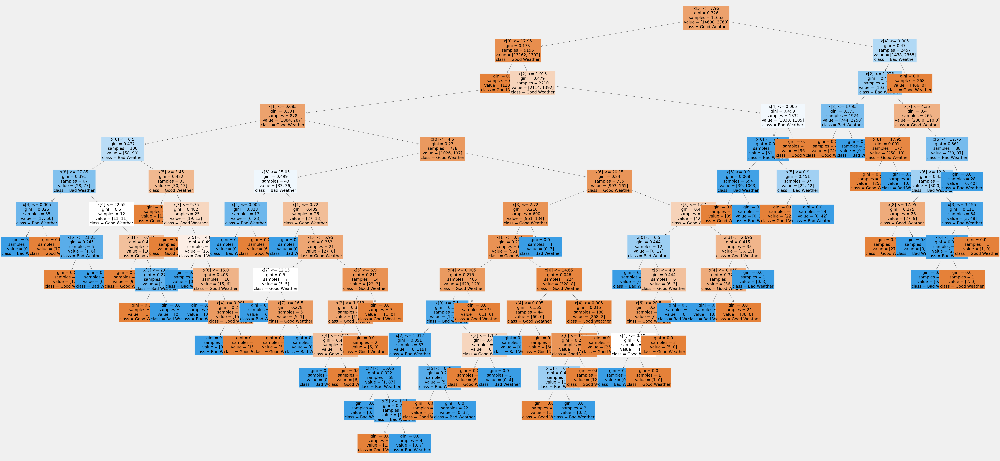

In [184]:
pred = ['Good Weather','Bad Weather']

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15],fontsize=20,class_names=pred,filled=True)

In [186]:
fig.savefig(os.path.join(path,'04 Analysis','Visualizations','maastricht_tree.png'))

In [188]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
newarray

array([0.03320971, 0.01858727, 0.01059606, 0.09531527, 0.31783799,
       0.08762988, 0.11622434, 0.02626963, 0.29432985])

In [190]:
np.set_printoptions(threshold=1000)

In [192]:
variables = [
    'cloud_cover',
    'humidity',
    'pressure',
    'global_ratiation',
    'precipitation',
    'sunshine',
    'temp_mean',
    'temp_min',
    'temp_max'
]

In [194]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

cloud_cover         0.033210
humidity            0.018587
pressure            0.010596
global_ratiation    0.095315
precipitation       0.317838
sunshine            0.087630
temp_mean           0.116224
temp_min            0.026270
temp_max            0.294330
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_ratiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


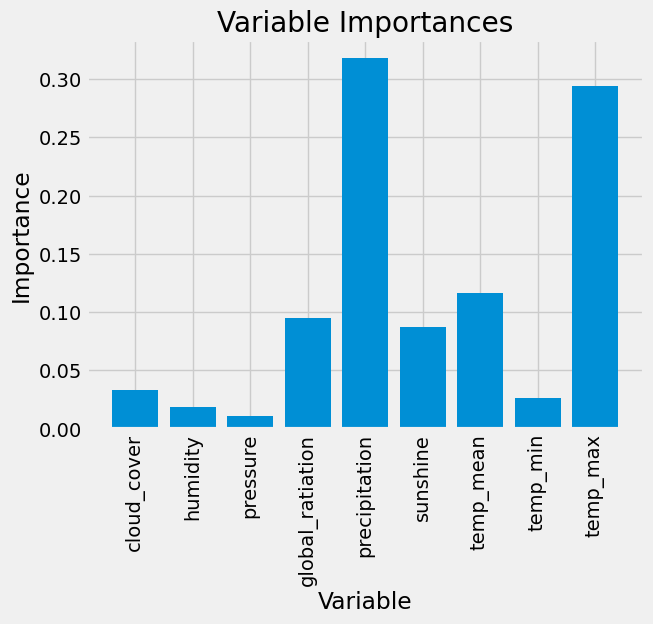

In [196]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### Dusseldorf

In [137]:
# Creating DUSSELDORF subset
df_dusseldorf = df_weather[['DUSSELDORF_cloud_cover','DUSSELDORF_humidity','DUSSELDORF_pressure','DUSSELDORF_global_radiation','DUSSELDORF_precipitation','DUSSELDORF_sunshine','DUSSELDORF_temp_mean','DUSSELDORF_temp_min','DUSSELDORF_temp_max']]
df_dusseldorf

,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
0,8,0.83,1.0161,0.12,0.08,0.0,10.0,7.0,11.5
1,8,0.89,1.0161,0.18,0.66,0.5,8.2,7.4,11.0
2,7,0.95,1.0161,0.12,0.07,0.0,7.1,6.9,9.1
3,8,0.86,1.0161,0.12,0.02,0.0,6.8,3.6,8.0
4,7,0.92,1.0161,0.12,0.62,0.0,7.7,6.2,11.0
...,...,...,...,...,...,...,...,...,...
22945,8,0.75,1.0214,1.13,0.20,6.4,17.8,13.6,21.4
22946,7,0.71,1.0186,1.13,0.20,4.9,19.4,15.4,23.9
22947,8,0.73,1.0196,1.13,0.20,4.0,18.2,13.4,22.0
22948,7,0.73,1.0176,1.13,0.20,6.9,16.7,11.9,21.1


In [139]:
df_dusseldorf_pleasant = df_pleasant[['DUSSELDORF_pleasant_weather']]
df_dusseldorf_pleasant

,DUSSELDORF_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [198]:
# Creating matrix
X = df_dusseldorf
y = df_dusseldorf_pleasant

print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [200]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [202]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [204]:
# Creating RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_train,y_train)

/home/cwidner/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [206]:
# Performing predictions on test dataset
y_pred = clf.predict(X_test)

# Calculating accuracy
print('Model Accuracy: ', metrics.accuracy_score(y_test,y_pred)) 

Model Accuracy:  1.0


[Text(0.44666466346153844, 0.9666666666666667, 'x[1] <= 0.725\ngini = 0.337\nsamples = 11577\nvalue = [14420.0, 3940.0]\nclass = Good Weather'),
 Text(0.18449519230769232, 0.9, 'x[3] <= 2.045\ngini = 0.496\nsamples = 4060\nvalue = [3500, 2916]\nclass = Good Weather'),
 Text(0.10576923076923077, 0.8333333333333334, 'x[7] <= 7.85\ngini = 0.366\nsamples = 2197\nvalue = [2643, 841]\nclass = Good Weather'),
 Text(0.03365384615384615, 0.7666666666666667, 'x[8] <= 17.95\ngini = 0.134\nsamples = 1266\nvalue = [1881, 147]\nclass = Good Weather'),
 Text(0.02403846153846154, 0.7, 'gini = 0.0\nsamples = 1148\nvalue = [1848, 0]\nclass = Good Weather'),
 Text(0.04326923076923077, 0.7, 'x[2] <= 1.013\ngini = 0.299\nsamples = 118\nvalue = [33, 147]\nclass = Bad Weather'),
 Text(0.019230769230769232, 0.6333333333333333, 'x[4] <= 0.02\ngini = 0.499\nsamples = 18\nvalue = [15.0, 14.0]\nclass = Good Weather'),
 Text(0.009615384615384616, 0.5666666666666667, 'gini = 0.0\nsamples = 9\nvalue = [0, 14]\nclass

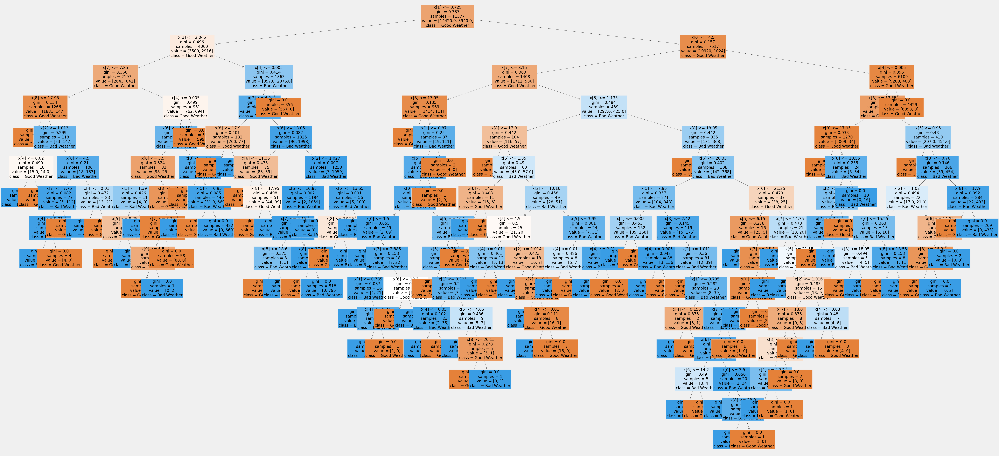

In [208]:
pred = ['Good Weather','Bad Weather']

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15],fontsize=20,class_names=pred,filled=True)

In [154]:
fig.savefig(os.path.join(path,'04 Analysis','Visualizations','dusseldorf_tree.png'))

In [210]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
newarray

array([0.03545164, 0.01446594, 0.01347739, 0.08021425, 0.34877529,
       0.08747281, 0.1338964 , 0.02091552, 0.26533076])

In [212]:
np.set_printoptions(threshold=1000)

In [214]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

cloud_cover         0.035452
humidity            0.014466
pressure            0.013477
global_ratiation    0.080214
precipitation       0.348775
sunshine            0.087473
temp_mean           0.133896
temp_min            0.020916
temp_max            0.265331
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_ratiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


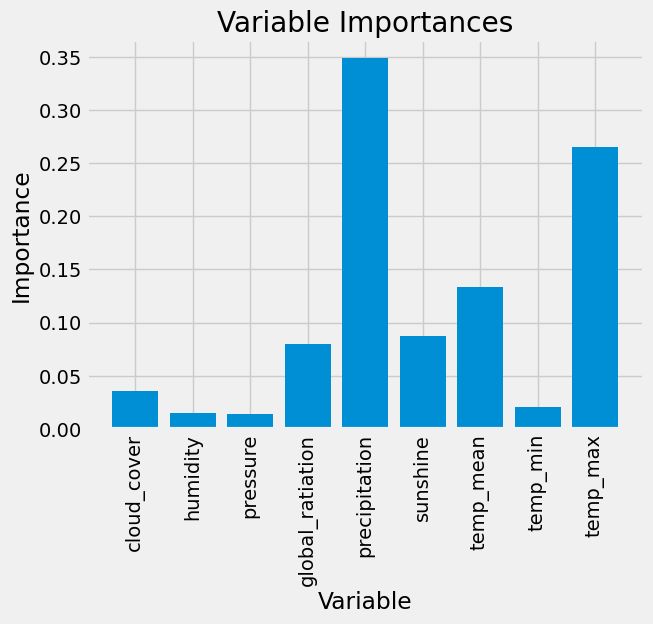

In [216]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### Debilt

In [156]:
# Creating DEBILT subset
df_debilt = df_weather[['DEBILT_cloud_cover','DEBILT_humidity','DEBILT_pressure','DEBILT_global_radiation','DEBILT_precipitation','DEBILT_sunshine','DEBILT_temp_mean','DEBILT_temp_min','DEBILT_temp_max']]
df_debilt

,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max
0,7,0.85,1.0032,0.07,0.25,0.0,9.3,7.4,11.0
1,8,0.90,1.0056,0.14,0.06,0.1,7.7,6.4,8.3
2,6,0.92,1.0165,0.28,0.01,3.0,6.8,4.6,9.9
3,8,0.95,1.0265,0.08,0.09,0.0,6.7,3.6,10.1
4,6,0.90,1.0243,0.04,0.39,0.0,8.0,2.4,11.2
...,...,...,...,...,...,...,...,...,...
22945,8,0.84,1.0190,1.13,0.22,2.8,15.7,12.8,19.4
22946,8,0.84,1.0177,1.13,0.22,3.5,16.0,10.3,20.5
22947,8,0.86,1.0174,1.13,0.22,3.3,15.8,9.3,21.1
22948,8,0.87,1.0174,1.13,0.22,6.0,14.4,10.3,20.2


In [158]:
df_debilt_pleasant = df_pleasant[['DEBILT_pleasant_weather']]
df_debilt_pleasant

,DEBILT_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [219]:
# Creating matrix
X = df_debilt
y = df_debilt_pleasant

print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [221]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [223]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [225]:
# Creating RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_train,y_train)

/home/cwidner/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [227]:
# Performing predictions on test dataset
y_pred = clf.predict(X_test)

# Calculating accuracy
print('Model Accuracy: ', metrics.accuracy_score(y_test,y_pred)) 

Model Accuracy:  1.0


[Text(0.4117647058823529, 0.96875, 'x[6] <= 13.15\ngini = 0.312\nsamples = 11604\nvalue = [14815.0, 3545.0]\nclass = Good Weather'),
 Text(0.18823529411764706, 0.90625, 'x[5] <= 10.15\ngini = 0.053\nsamples = 7546\nvalue = [11623, 324]\nclass = Good Weather'),
 Text(0.047058823529411764, 0.84375, 'x[8] <= 17.95\ngini = 0.026\nsamples = 7187\nvalue = [11185, 149]\nclass = Good Weather'),
 Text(0.023529411764705882, 0.78125, 'gini = 0.0\nsamples = 7055\nvalue = [11126, 0]\nclass = Good Weather'),
 Text(0.07058823529411765, 0.78125, 'x[4] <= 0.005\ngini = 0.406\nsamples = 132\nvalue = [59, 149]\nclass = Bad Weather'),
 Text(0.047058823529411764, 0.71875, 'gini = 0.0\nsamples = 96\nvalue = [0, 149]\nclass = Bad Weather'),
 Text(0.09411764705882353, 0.71875, 'gini = 0.0\nsamples = 36\nvalue = [59, 0]\nclass = Good Weather'),
 Text(0.32941176470588235, 0.84375, 'x[0] <= 0.5\ngini = 0.408\nsamples = 359\nvalue = [438, 175]\nclass = Good Weather'),
 Text(0.16470588235294117, 0.78125, 'x[6] <= 

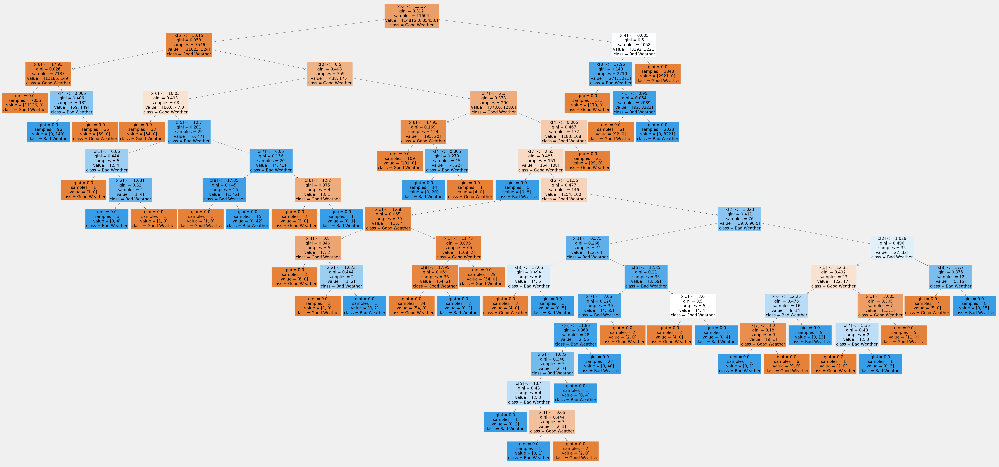

In [229]:
pred = ['Good Weather','Bad Weather']

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15],fontsize=20,class_names=pred,filled=True)

In [172]:
fig.savefig(os.path.join(path,'04 Analysis','Visualizations','debilt_tree.png'))

In [231]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
newarray

array([0.02856618, 0.01732333, 0.01348089, 0.08164424, 0.33013617,
       0.0683945 , 0.14671786, 0.02251711, 0.29121972])

In [233]:
np.set_printoptions(threshold=1000)

In [235]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

cloud_cover         0.028566
humidity            0.017323
pressure            0.013481
global_ratiation    0.081644
precipitation       0.330136
sunshine            0.068394
temp_mean           0.146718
temp_min            0.022517
temp_max            0.291220
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_ratiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


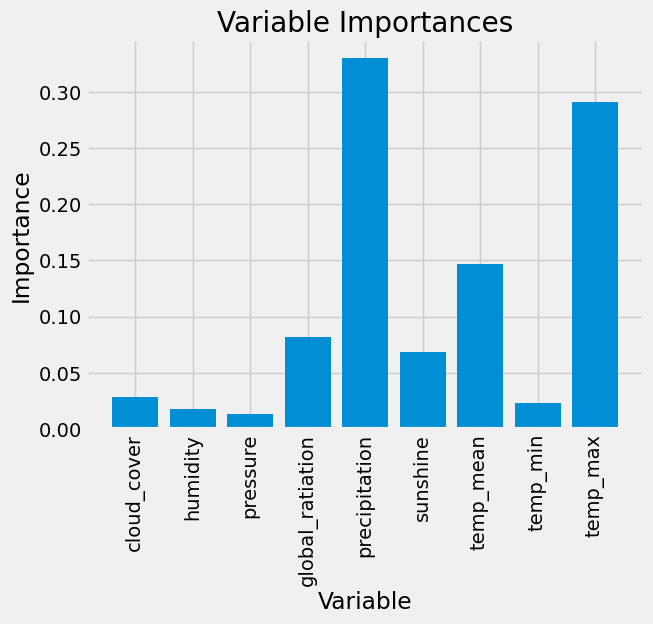

In [237]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');